# Trabalho Integrado: Quantum Finance

Neste trabalho, como parte do time de analistas da Quantum Finance, vocês deverão explorar uma base de dados originalmente utilizada para classificação de score de crédito, utilizando técnicas de Análise Exploratória de Dados (EDA) e algoritmos de Machine Learning supervisionados ou não supervisionados. dados:https://raw.githubusercontent.com/lcbjrrr/QuantumF/main/credit%20-%20ok.csv

O objetivo é aplicar e interpretar os resultados obtidos, assim como criar um sistema que gere valor a partir da análise da base de dados.


Parte 1: Modelo de Classificação Supervisionada - Desenvolver um modelo de classificação supervisionada para prever a classificação de crédito dos indivíduos presentes na base. Passos esperados:
-  Realizar uma análise exploratória dos dados (EDA) para entender as características principais da base e as relações entre variáveis;
- Implementar o modelo de classificação (ex.: Decision Tree, Random Forest, Logistic Regression, ou outro);
- Avaliar os resultados utilizando métricas como acurácia, F1-score, matriz de confusão, entre outras relevantes;
- Apresentar os resultados e explicar como o modelo pode ser utilizado para decisões financeiras.


Parte 2: Algoritmo Não Supervisionado - Implementar um algoritmo não supervisionado. Passos esperados:
- Realizar a análise de negócio para definir as estratégias da aplicação do algoritmo não supervisionado
- Aplicar a técnica escolhida (ex: Apriori ou KMeans) e documentar a experiência, destacando os resultados obtidos, os desafios enfrentados, e as conclusões da abordagem escolhida.

# 1. Lendo o dataset

In [162]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [163]:
df = pd.read_csv('https://raw.githubusercontent.com/lcbjrrr/QuantumF/main/credit%20-%20ok.csv')
df.head(50)

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529544,High_spent_Small_value_payments,312.4940887,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.944960,NaN,No,49.574949,118.2802216,Low_spent_Large_value_payments,284.6291625,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.69952126,Low_spent_Medium_value_payments,331.2098629,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580744,Low_spent_Small_value_payments,223.4513097,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.42015309,High_spent_Medium_value_payments,341.489231,Good
5,0x1607,CUS_0xd40,June,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,27.262259,22 Years and 6 Months,No,49.574949,62.43017233,!@9#%8,340.4792118,Good
6,0x1608,CUS_0xd40,July,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,22.537593,22 Years and 7 Months,No,49.574949,178.3440674,Low_spent_Small_value_payments,244.5653167,Good
7,0x1609,CUS_0xd40,August,NaN,23,#F%$D@*&8,Scientist,19114.12,1824.843333,3,...,Good,809.98,23.933795,NaN,No,49.574949,24.78521651,High_spent_Medium_value_payments,358.1241676,Standard
8,0x160e,CUS_0x21b1,January,Rick Rothackerj,28_,004-07-5839,_______,34847.84,3037.986667,2,...,Good,605.03,24.464031,26 Years and 7 Months,No,18.816215,104.2918252,Low_spent_Small_value_payments,470.6906269,Standard
9,0x160f,CUS_0x21b1,February,Rick Rothackerj,28,004-07-5839,Teacher,34847.84,3037.986667,2,...,Good,605.03,38.550848,26 Years and 8 Months,No,18.816215,40.39123783,High_spent_Large_value_payments,484.5912143,Good


In [164]:
df.head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529544,High_spent_Small_value_payments,312.4940887,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.944960,NaN,No,49.574949,118.2802216,Low_spent_Large_value_payments,284.6291625,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.69952126,Low_spent_Medium_value_payments,331.2098629,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580744,Low_spent_Small_value_payments,223.4513097,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.42015309,High_spent_Medium_value_payments,341.489231,Good


In [165]:
df['Credit_Score'].unique()

array(['Good', 'Standard', 'Poor'], dtype=object)

# 2. Limpeza do Dataset

**Pontos de atenção:**
- Caractere _ que não deveria existir nos campos
- Missing value
- Volumetrias fora do esperado 
- Payment_Behavior com valores quebrados
- Campos fora do formato esperado
- Credit_History_Age como texto

In [166]:
df_tratado = df.copy()

## 2.1. Removendo _, '', '!@9#%8' e '#F%$D@*&8'

In [167]:
df_tratado = df_tratado.replace('_', '', regex=True)
df_tratado.replace('', np.nan, inplace=True)
df_tratado.replace('!@9#%8', np.nan, inplace=True)
df_tratado.replace('#F%$D@*&8', np.nan, inplace=True)
df_tratado.head(10)

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,NaN,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529544,HighspentSmallvaluepayments,312.4940887,Good
1,0x1603,CUS0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.944960,NaN,No,49.574949,118.2802216,LowspentLargevaluepayments,284.6291625,Good
2,0x1604,CUS0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.69952126,LowspentMediumvaluepayments,331.2098629,Good
3,0x1605,CUS0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580744,LowspentSmallvaluepayments,223.4513097,Good
4,0x1606,CUS0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.42015309,HighspentMediumvaluepayments,341.489231,Good
5,0x1607,CUS0xd40,June,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,27.262259,22 Years and 6 Months,No,49.574949,62.43017233,NaN,340.4792118,Good
6,0x1608,CUS0xd40,July,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,22.537593,22 Years and 7 Months,No,49.574949,178.3440674,LowspentSmallvaluepayments,244.5653167,Good
7,0x1609,CUS0xd40,August,NaN,23,NaN,Scientist,19114.12,1824.843333,3,...,Good,809.98,23.933795,NaN,No,49.574949,24.78521651,HighspentMediumvaluepayments,358.1241676,Standard
8,0x160e,CUS0x21b1,January,Rick Rothackerj,28,004-07-5839,NaN,34847.84,3037.986667,2,...,Good,605.03,24.464031,26 Years and 7 Months,No,18.816215,104.2918252,LowspentSmallvaluepayments,470.6906269,Standard
9,0x160f,CUS0x21b1,February,Rick Rothackerj,28,004-07-5839,Teacher,34847.84,3037.986667,2,...,Good,605.03,38.550848,26 Years and 8 Months,No,18.816215,40.39123783,HighspentLargevaluepayments,484.5912143,Good


## 2.2. Preenchendo com a moda os Missing Value das dimensões

In [168]:
dim = ['Month', 'Name', 'SSN', 'Occupation', 'Type_of_Loan', 'Credit_Mix', 'Credit_History_Age', 'Payment_of_Min_Amount', 'Payment_Behaviour', ]

for dime in dim:
    # Cria tabela aux para moda do campo
    moda_por_cliente = (
        df_tratado.dropna(subset=[dime])  
        .groupby('Customer_ID')[dime]
        .agg(lambda x: x.mode().iloc[0])  
        .reset_index()
        .rename(columns={dime: 'moda_dim'})
    ).copy()

    # Junta essa moda de volta no dataframe original
    df_tratado = df_tratado.merge(moda_por_cliente, on='Customer_ID', how='left')

    # Preenche os nulos com a moda
    df_tratado[dime] = df_tratado[dime].fillna(df_tratado['moda_dim'])

    # Remover a coluna auxiliar
    df_tratado = df_tratado.drop(columns=['moda_dim'])
    
    print(f'tudo ok, dime: {dime}')

df_tratado.head(30)

tudo ok, dime: Month
tudo ok, dime: Name
tudo ok, dime: SSN
tudo ok, dime: Occupation
tudo ok, dime: Type_of_Loan
tudo ok, dime: Credit_Mix
tudo ok, dime: Credit_History_Age
tudo ok, dime: Payment_of_Min_Amount
tudo ok, dime: Payment_Behaviour


,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529544,HighspentSmallvaluepayments,312.4940887,Good
1,0x1603,CUS0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.944960,22 Years and 1 Months,No,49.574949,118.2802216,LowspentLargevaluepayments,284.6291625,Good
2,0x1604,CUS0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.69952126,LowspentMediumvaluepayments,331.2098629,Good
3,0x1605,CUS0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580744,LowspentSmallvaluepayments,223.4513097,Good
4,0x1606,CUS0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.42015309,HighspentMediumvaluepayments,341.489231,Good
5,0x1607,CUS0xd40,June,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,27.262259,22 Years and 6 Months,No,49.574949,62.43017233,HighspentMediumvaluepayments,340.4792118,Good
6,0x1608,CUS0xd40,July,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,22.537593,22 Years and 7 Months,No,49.574949,178.3440674,LowspentSmallvaluepayments,244.5653167,Good
7,0x1609,CUS0xd40,August,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,23.933795,22 Years and 1 Months,No,49.574949,24.78521651,HighspentMediumvaluepayments,358.1241676,Standard
8,0x160e,CUS0x21b1,January,Rick Rothackerj,28,004-07-5839,Teacher,34847.84,3037.986667,2,...,Good,605.03,24.464031,26 Years and 7 Months,No,18.816215,104.2918252,LowspentSmallvaluepayments,470.6906269,Standard
9,0x160f,CUS0x21b1,February,Rick Rothackerj,28,004-07-5839,Teacher,34847.84,3037.986667,2,...,Good,605.03,38.550848,26 Years and 8 Months,No,18.816215,40.39123783,HighspentLargevaluepayments,484.5912143,Good


In [169]:

# Transformando Credit_History_Age em numérica
df_tratado['Credit_History_Age'] = df_tratado['Credit_History_Age'].str.extract(r'(?P<years>\d+)\s+Years?\s+and\s+(?P<months>\d+)\s+Months?').astype(float).eval('years * 12 + months')
df_tratado

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,26.822620,265.0,No,49.574949,80.41529544,HighspentSmallvaluepayments,312.4940887,Good
1,0x1603,CUS0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.944960,265.0,No,49.574949,118.2802216,LowspentLargevaluepayments,284.6291625,Good
2,0x1604,CUS0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,28.609352,267.0,No,49.574949,81.69952126,LowspentMediumvaluepayments,331.2098629,Good
3,0x1605,CUS0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.377862,268.0,No,49.574949,199.4580744,LowspentSmallvaluepayments,223.4513097,Good
4,0x1606,CUS0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,24.797347,269.0,No,49.574949,41.42015309,HighspentMediumvaluepayments,341.489231,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83139,0x25fe9,CUS0x942c,April,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,Good,502.38,34.663572,378.0,No,35.104023,60.97133256,HighspentLargevaluepayments,479.8662282,Poor
83140,0x25fea,CUS0x942c,May,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,Good,502.38,40.565631,379.0,No,35.104023,54.18595029,HighspentMediumvaluepayments,496.6516104,Poor
83141,0x25feb,CUS0x942c,June,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,Good,502.38,41.255522,380.0,No,35.104023,24.02847745,HighspentLargevaluepayments,516.8090833,Poor
83142,0x25fec,CUS0x942c,July,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,Good,502.38,33.638208,381.0,No,35.104023,251.6725822,LowspentLargevaluepayments,319.1649785,Standard


## 2.3. Tratando campos numéricos

In [170]:
nume = ['Age', 'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts', 'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan', 'Delay_from_due_date', 'Num_of_Delayed_Payment', 
        'Changed_Credit_Limit', 'Num_Credit_Inquiries', 'Outstanding_Debt', 'Credit_Utilization_Ratio', 'Total_EMI_per_month', 'Amount_invested_monthly', 'Monthly_Balance', 'Credit_History_Age']

nume_zeros = ['Num_Credit_Inquiries', 'Monthly_Balance', 'Monthly_Inhand_Salary','Num_of_Delayed_Payment', 
              'Changed_Credit_Limit', 'Amount_invested_monthly']

df_tratado[nume] = df_tratado[nume].astype(float)
df_tratado[nume_zeros] = df_tratado[nume_zeros].fillna(0)
df_tratado

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS0xd40,January,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,26.822620,265.0,No,49.574949,80.415295,HighspentSmallvaluepayments,312.494089,Good
1,0x1603,CUS0xd40,February,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,0.000000,3.0,...,Good,809.98,31.944960,265.0,No,49.574949,118.280222,LowspentLargevaluepayments,284.629163,Good
2,0x1604,CUS0xd40,March,Aaron Maashoh,-500.0,821-00-0265,Scientist,19114.12,0.000000,3.0,...,Good,809.98,28.609352,267.0,No,49.574949,81.699521,LowspentMediumvaluepayments,331.209863,Good
3,0x1605,CUS0xd40,April,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,0.000000,3.0,...,Good,809.98,31.377862,268.0,No,49.574949,199.458074,LowspentSmallvaluepayments,223.451310,Good
4,0x1606,CUS0xd40,May,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,24.797347,269.0,No,49.574949,41.420153,HighspentMediumvaluepayments,341.489231,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83139,0x25fe9,CUS0x942c,April,Nicks,25.0,078-73-5990,Mechanic,39628.99,3359.415833,4.0,...,Good,502.38,34.663572,378.0,No,35.104023,60.971333,HighspentLargevaluepayments,479.866228,Poor
83140,0x25fea,CUS0x942c,May,Nicks,25.0,078-73-5990,Mechanic,39628.99,3359.415833,4.0,...,Good,502.38,40.565631,379.0,No,35.104023,54.185950,HighspentMediumvaluepayments,496.651610,Poor
83141,0x25feb,CUS0x942c,June,Nicks,25.0,078-73-5990,Mechanic,39628.99,3359.415833,4.0,...,Good,502.38,41.255522,380.0,No,35.104023,24.028477,HighspentLargevaluepayments,516.809083,Poor
83142,0x25fec,CUS0x942c,July,Nicks,25.0,078-73-5990,Mechanic,39628.99,3359.415833,4.0,...,Good,502.38,33.638208,381.0,No,35.104023,251.672582,LowspentLargevaluepayments,319.164979,Standard


In [171]:
for num in nume:
    # Calcular os limites para os Outliers 
    df_outlier = df_tratado.groupby('Customer_ID')[num].agg([
        ('p25', lambda x: x.quantile(0.25)),
        ('p75', lambda x: x.quantile(0.75))
    ])
    df_outlier['IQR'] = df_outlier['p75'] - df_outlier['p25']
    df_outlier['lim_inf'] = df_outlier['p25'] - (1.5*df_outlier['IQR']) - 1
    df_outlier['lim_sup'] = df_outlier['p75'] + (1.5*df_outlier['IQR']) + 1
    df_outlier = df_outlier.drop(columns=['p25', 'p75', 'IQR'])

    # Junta essa moda de volta no dataframe original
    df_tratado = df_tratado.merge(df_outlier, on='Customer_ID', how='left')

    # Troca os outliers por nulo
    df_tratado.loc[(df_tratado[num] < df_tratado['lim_inf']) | (df_tratado[num] > df_tratado['lim_sup']), num] = None 

    # Aplica a mediana do grupo nos valores nulos
    df_tratado[num] = df_tratado.groupby('Customer_ID')[num].transform(lambda x: x.fillna(x.median()))

    # Remover a coluna auxiliar
    df_tratado = df_tratado.drop(columns=['lim_inf', 'lim_sup'])

    print(f'tudo ok, dime: {num}')

df_tratado

tudo ok, dime: Age
tudo ok, dime: Annual_Income
tudo ok, dime: Monthly_Inhand_Salary
tudo ok, dime: Num_Bank_Accounts
tudo ok, dime: Num_Credit_Card
tudo ok, dime: Interest_Rate
tudo ok, dime: Num_of_Loan
tudo ok, dime: Delay_from_due_date
tudo ok, dime: Num_of_Delayed_Payment
tudo ok, dime: Changed_Credit_Limit
tudo ok, dime: Num_Credit_Inquiries
tudo ok, dime: Outstanding_Debt
tudo ok, dime: Credit_Utilization_Ratio
tudo ok, dime: Total_EMI_per_month
tudo ok, dime: Amount_invested_monthly
tudo ok, dime: Monthly_Balance
tudo ok, dime: Credit_History_Age


,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS0xd40,January,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,26.822620,265.0,No,49.574949,80.415295,HighspentSmallvaluepayments,312.494089,Good
1,0x1603,CUS0xd40,February,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,0.000000,3.0,...,Good,809.98,31.944960,265.0,No,49.574949,118.280222,LowspentLargevaluepayments,284.629163,Good
2,0x1604,CUS0xd40,March,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,0.000000,3.0,...,Good,809.98,28.609352,267.0,No,49.574949,81.699521,LowspentMediumvaluepayments,331.209863,Good
3,0x1605,CUS0xd40,April,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,0.000000,3.0,...,Good,809.98,31.377862,268.0,No,49.574949,199.458074,LowspentSmallvaluepayments,223.451310,Good
4,0x1606,CUS0xd40,May,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,24.797347,269.0,No,49.574949,41.420153,HighspentMediumvaluepayments,341.489231,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83139,0x25fe9,CUS0x942c,April,Nicks,25.0,078-73-5990,Mechanic,39628.99,3359.415833,4.0,...,Good,502.38,34.663572,378.0,No,35.104023,60.971333,HighspentLargevaluepayments,479.866228,Poor
83140,0x25fea,CUS0x942c,May,Nicks,25.0,078-73-5990,Mechanic,39628.99,3359.415833,4.0,...,Good,502.38,40.565631,379.0,No,35.104023,54.185950,HighspentMediumvaluepayments,496.651610,Poor
83141,0x25feb,CUS0x942c,June,Nicks,25.0,078-73-5990,Mechanic,39628.99,3359.415833,4.0,...,Good,502.38,41.255522,380.0,No,35.104023,24.028477,HighspentLargevaluepayments,516.809083,Poor
83142,0x25fec,CUS0x942c,July,Nicks,25.0,078-73-5990,Mechanic,39628.99,3359.415833,4.0,...,Good,502.38,33.638208,381.0,No,35.104023,251.672582,LowspentLargevaluepayments,319.164979,Standard


## 2.4. Retira clientes com idade acima de 120 anos

In [181]:
df_tratado = df_tratado[df_tratado['Age'] <= 120] 
df_tratado = df_tratado[df_tratado['Age'] > 0] 

# 3. Análise Descritiva
## 3.1 Qualitativo

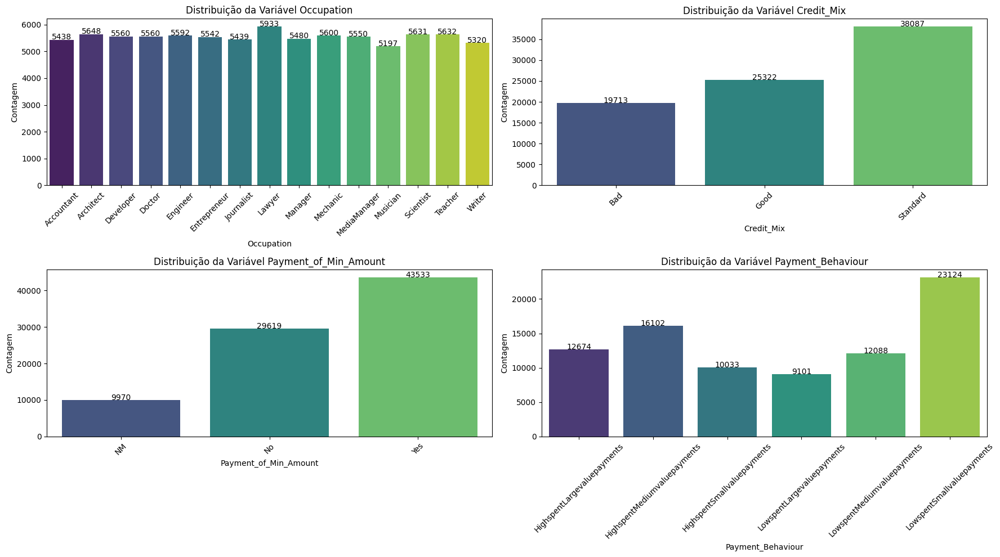

In [182]:
dim_graf = ['Occupation','Credit_Mix','Payment_of_Min_Amount','Payment_Behaviour']

fig, axes = plt.subplots(2, 2, figsize=(18, 10))  # Cria uma figura com 2 linhas e 3 colunas
axes = axes.flatten()  # Transforma em uma lista para fácil iteração

for i, dime in enumerate(dim_graf):
    counts = df_tratado[dime].value_counts().sort_index()
    sns.barplot(x=counts.index, y=counts.values, hue=counts.index, palette='viridis', dodge=False, legend=False, ax=axes[i])
    
    # Adiciona rótulos numéricos no topo das barras
    for j, v in enumerate(counts.values):
        axes[i].text(j, v + 5, str(v), ha='center', fontsize=10)
    
    axes[i].set_title(f'Distribuição da Variável {dime}')
    axes[i].set_xlabel(dime)
    axes[i].set_ylabel('Contagem')
    axes[i].tick_params(axis='x', rotation=45)

# Remove o subplot vazio (caso tenha menos de 6 gráficos)
if len(dim_graf) < len(axes):
    for j in range(len(dim_graf), len(axes)):
        fig.delaxes(axes[j])  # Ou: axes[j].axis('off') para só esconder

plt.tight_layout()
plt.show()

## 3.2 Quantitativo

In [183]:
nume = ['Age', 'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts', 'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan', 'Delay_from_due_date', 'Num_of_Delayed_Payment', 
        'Changed_Credit_Limit', 'Num_Credit_Inquiries', 'Outstanding_Debt', 'Credit_Utilization_Ratio', 'Total_EMI_per_month', 'Amount_invested_monthly', 'Monthly_Balance', 'Credit_History_Age']

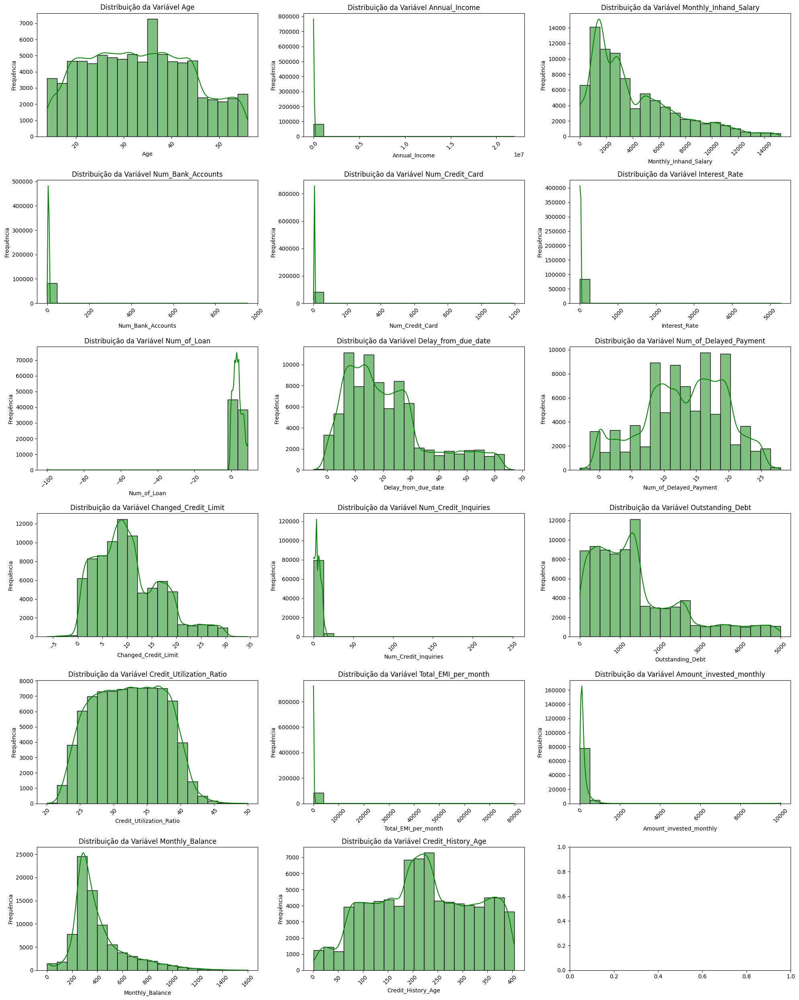

In [198]:
fig, axes = plt.subplots(6, 3, figsize=(20, 25))  
axes = axes.flatten()  

for i, num in enumerate(nume):

    sns.histplot(df_tratado[num], bins=20, kde=True, color='green', ax=axes[i])

    axes[i].set_title(f'Distribuição da Variável {num}')
    axes[i].set_xlabel(num)
    axes[i].set_ylabel('Frequência')
    axes[i].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

# 4. Análise Bivariada

## 4.1 Qualitativo

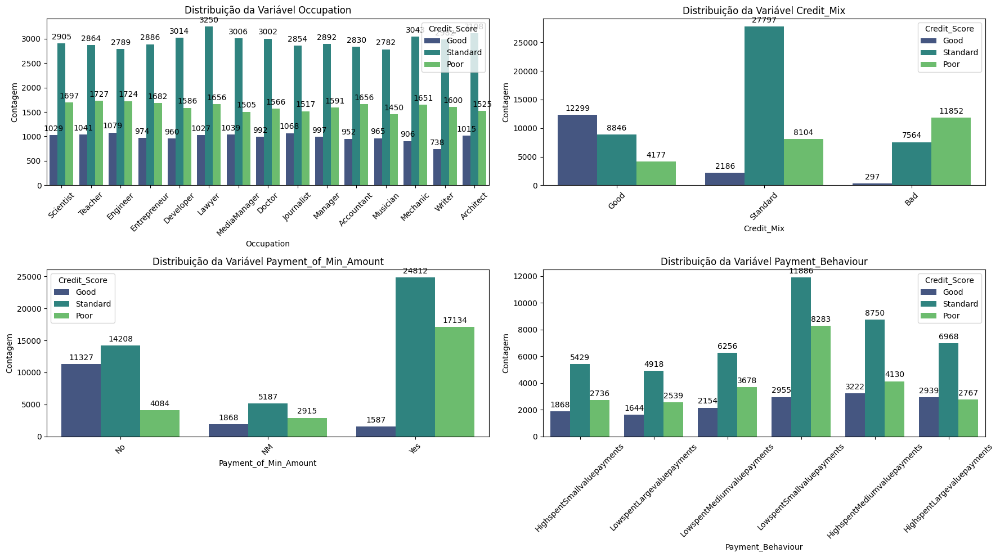

In [194]:
fig, axes = plt.subplots(2, 2, figsize=(18, 10))  # 2x2 = 4 subplots
axes = axes.flatten()

for i, dime in enumerate(dim_graf):
    sns.countplot(data=df_tratado, x=dime, hue='Credit_Score', palette='viridis', dodge=True, ax=axes[i], legend=True)

    # Adiciona rótulos no topo das barras
    for container in axes[i].containers:
        axes[i].bar_label(container, fontsize=10, padding=3)

    axes[i].set_title(f'Distribuição da Variável {dime}')
    axes[i].set_xlabel(dime)
    axes[i].set_ylabel('Contagem')
    axes[i].tick_params(axis='x', rotation=45)

# Remove o subplot vazio
if len(dim_graf) < len(axes):
    for j in range(len(dim_graf), len(axes)):
        fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

## 4.2 Quantitativo

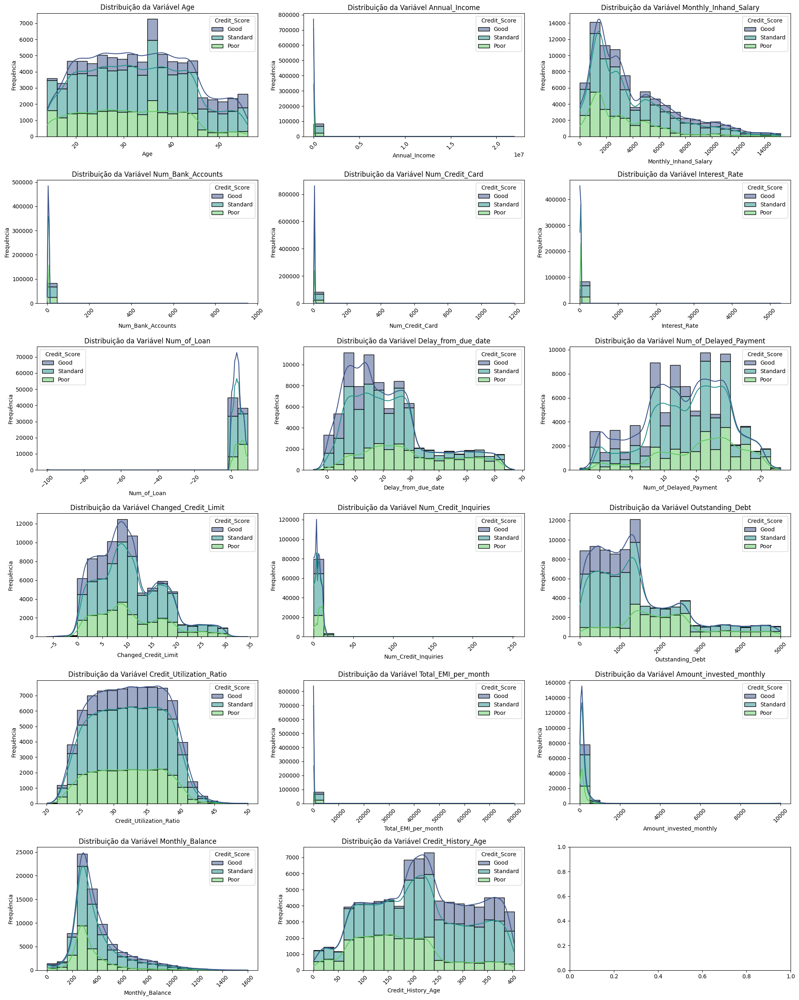

In [197]:
fig, axes = plt.subplots(6, 3, figsize=(20, 25))  
axes = axes.flatten()  

for i, num in enumerate(nume):
    sns.histplot(data=df_tratado, x=num, bins=20, kde=True, hue='Credit_Score', palette='viridis', ax=axes[i], multiple="stack")
    axes[i].set_title(f'Distribuição da Variável {num}')
    axes[i].set_xlabel(num)
    axes[i].set_ylabel('Frequência')
    axes[i].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

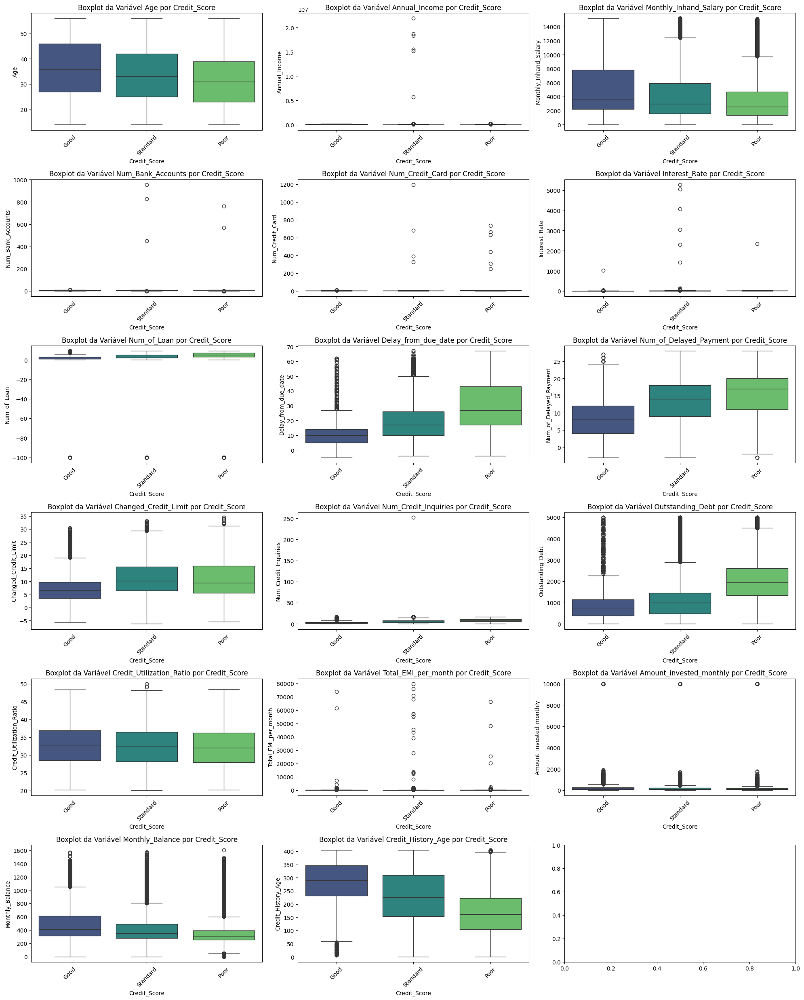

In [200]:
fig, axes = plt.subplots(6, 3, figsize=(20, 25))  
axes = axes.flatten()  

for i, num in enumerate(nume):
    sns.boxplot(
        data=df_tratado, 
        x='Credit_Score', 
        y=num, 
        hue = 'Credit_Score',
        palette='viridis', 
        ax=axes[i]
    )
    axes[i].set_title(f'Boxplot da Variável {num} por Credit_Score')
    axes[i].set_xlabel('Credit_Score')
    axes[i].set_ylabel(num)
    axes[i].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


# 5. Remoção de Outliers e seleção de Features e normalização

## 5.1 Retirada manual de valores possivelmente errados

In [237]:
print('Annual_Income:', df_tratado[df_tratado['Annual_Income'] > 500000].shape[0])
print('Num_Bank_Accounts:', df_tratado[df_tratado['Num_Bank_Accounts'] > 100].shape[0])
print('Num_Credit_Card:', df_tratado[df_tratado['Num_Credit_Card'] > 50].shape[0])
print('Interest_Rate:', df_tratado[df_tratado['Interest_Rate'] > 100].shape[0])
print('Num_of_Loan:', df_tratado[df_tratado['Num_of_Loan'] < 0].shape[0])
print('Num_Credit_Inquiries:', df_tratado[df_tratado['Num_Credit_Inquiries'] > 50].shape[0])
print('Interest_Rate:', df_tratado[df_tratado['Interest_Rate'] > 100].shape[0])
print('Amount_invested_monthly:', df_tratado[df_tratado['Amount_invested_monthly'] > 4000].shape[0])
print('Total_EMI_per_month:', df_tratado[df_tratado['Total_EMI_per_month'] > 2000].shape[0])

Annual_Income: 6
Num_Bank_Accounts: 5
Num_Credit_Card: 10
Interest_Rate: 10
Num_of_Loan: 95
Num_Credit_Inquiries: 1
Interest_Rate: 10
Amount_invested_monthly: 123
Total_EMI_per_month: 26


In [243]:
df_clear = df_tratado[df_tratado['Annual_Income'] <= 500000].copy()
df_clear = df_clear[df_clear['Num_Bank_Accounts'] <= 100]
df_clear = df_clear[df_clear['Num_Credit_Card'] <= 50]
df_clear = df_clear[df_clear['Interest_Rate'] <= 100]
df_clear = df_clear[df_clear['Num_of_Loan'] >= 0]
df_clear = df_clear[df_clear['Num_Credit_Inquiries'] <= 50]
df_clear = df_clear[df_clear['Amount_invested_monthly'] <= 4000]
df_clear = df_clear[df_clear['Total_EMI_per_month'] <= 2000]

In [249]:
print('Quantidade de linhas retiradas:', df_tratado.shape[0] - df_clear.shape[0])
print('Porcentagem:', (df_tratado.shape[0] - df_clear.shape[0])/df_tratado.shape[0])

Quantidade de linhas retiradas: 276
Porcentagem: 0.003320420586607637


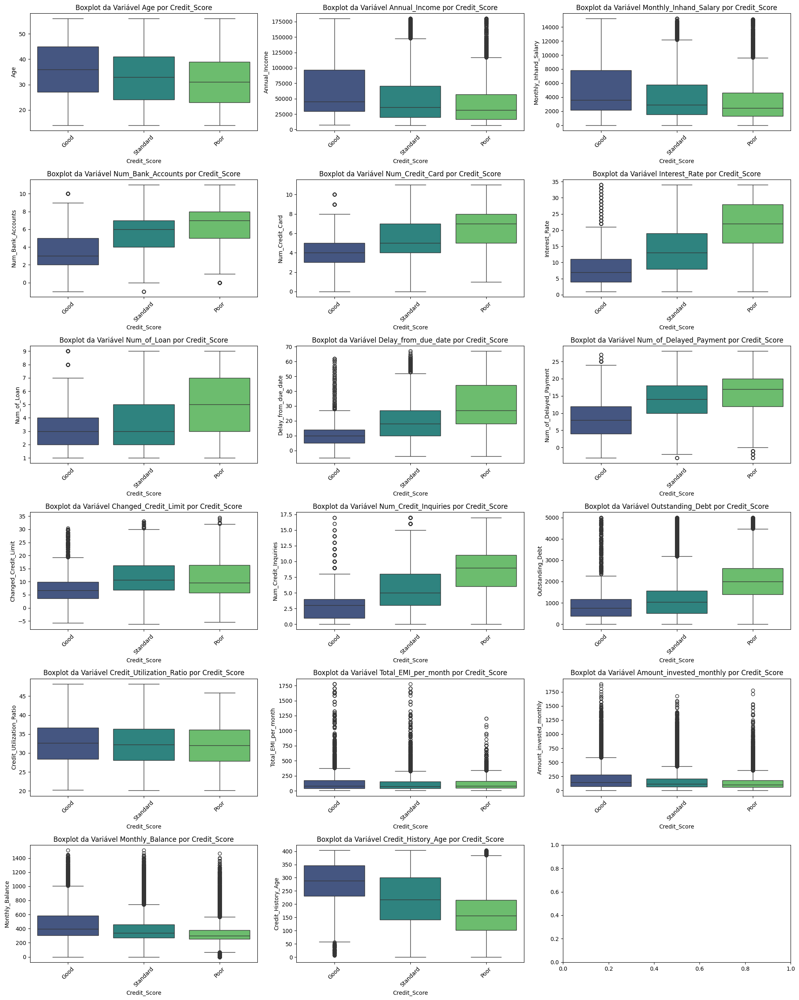

In [239]:
fig, axes = plt.subplots(6, 3, figsize=(20, 25))  
axes = axes.flatten()  

for i, num in enumerate(nume):
    sns.boxplot(
        data=df_clear, 
        x='Credit_Score', 
        y=num, 
        hue = 'Credit_Score',
        palette='viridis', 
        ax=axes[i]
    )
    axes[i].set_title(f'Boxplot da Variável {num} por Credit_Score')
    axes[i].set_xlabel('Credit_Score')
    axes[i].set_ylabel(num)
    axes[i].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


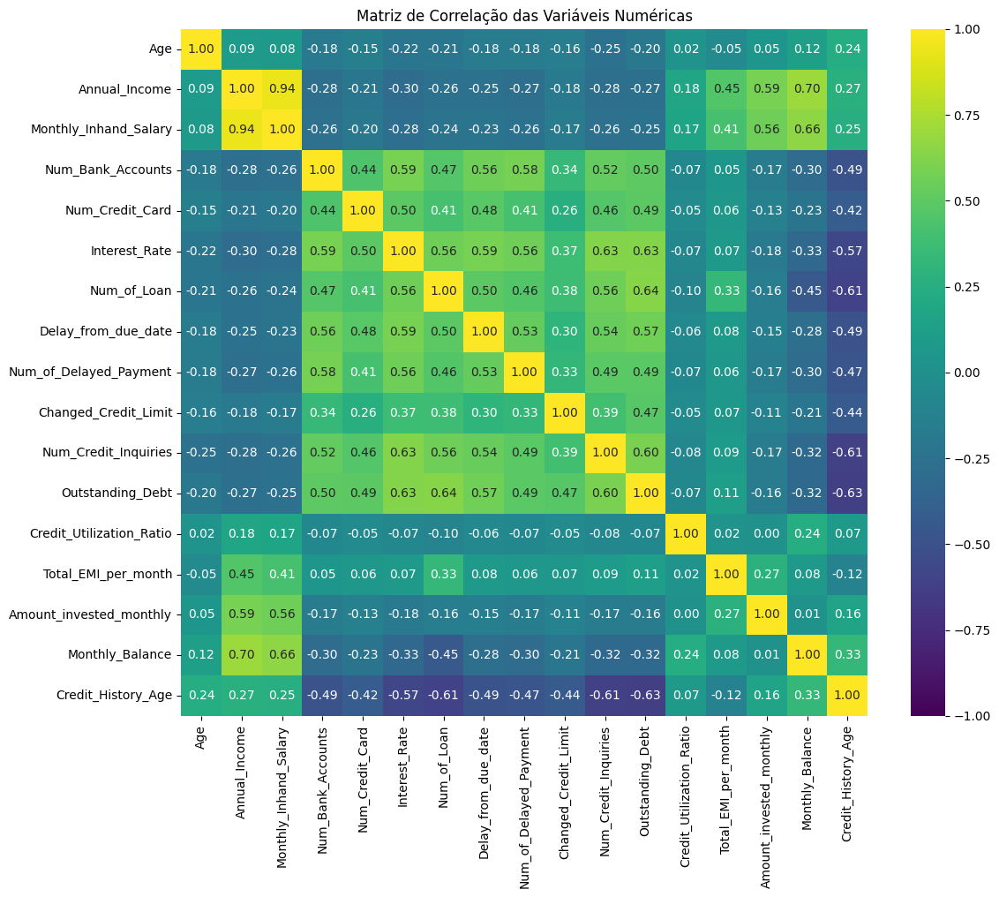

In [253]:
corr_matrix = df_clear[nume].corr()

plt.figure(figsize=(12, 10))
sns.heatmap(
    corr_matrix,
    annot=True,         
    fmt=".2f",          
    cmap="viridis",    
    vmin=-1, vmax=1,    
    square=True        
)
plt.title('Matriz de Correlação das Variáveis Numéricas')
plt.tight_layout()
plt.show()

## 5.2 Seleção de Features

- 'ID': Não será utilizado por se tratar de um identificador único.
- 'Customer_ID': Não será utilizado por se tratar de um identificador de cliente.
- 'Month': Não será utilizado por representar apenas o mês da análise, sem valor preditivo relevante.
- 'Name': Não será utilizado por se tratar de um identificador.
- 'Age': Será utilizado como variável numérica, pois observa-se que clientes mais velhos tendem a apresentar melhor score.
- 'SSN': Não será utilizado por se tratar de um identificador
- 'Occupation': Não será utilizado por possuir um impacto muito baixo nos testes.
- 'Annual_Income': Será utilizado como variável numérica, dado que há correlação entre maior renda e melhor score.
- 'Monthly_Inhand_Salary': Não será utilizado por apresentar alta correlação (0,94) com 'Annual_Income'.
- 'Num_Bank_Accounts': Será utilizado como variável numérica, pois há tendência de melhor score entre clientes com menos contas bancárias.
- 'Num_Credit_Card': Será utilizado como variável numérica, pois quanto menor o número de cartões, melhor tende a ser o score.
- 'Interest_Rate': Será utilizado como variável numérica, pois taxas de juros menores estão associadas a scores mais altos.
- 'Num_of_Loan': Será utilizado como variável numérica, pois clientes com menos empréstimos geralmente apresentam melhor score.
- 'Type_of_Loan': Não será utilizado devido à grande quantidade de categorias, o que pode causar overfitting no modelo.
- 'Delay_from_due_date': Será utilizado como variável numérica, pois menos dias de atraso indicam melhor score.
- 'Num_of_Delayed_Payment': Será utilizado como variável numérica, com lógica semelhante ao item anterior.
- 'Changed_Credit_Limit': Será utilizado como variável numérica, pois grandes variações estão associadas a menor score.
- 'Num_Credit_Inquiries': Será utilizado como variável numérica, pois muitas consultas indicam maior risco e menor score.
- 'Credit_Mix': Será utilizado como variável categórica, dado que há variação relevante entre suas categorias.
- 'Outstanding_Debt': Não será utilizado devido à presença de muitos outliers.
- 'Credit_Utilization_Ratio': Não será utilizado por não apresentar variações significativas.
- 'Credit_History_Age': Será utilizado como variável numérica, pois menor histórico costuma estar relacionado a melhor score.
- 'Payment_of_Min_Amount': Não será utilizado por possuir um impacto muito baixo nos testes.
- 'Total_EMI_per_month': Não será utilizado devido à alta presença de outliers.
- 'Amount_invested_monthly': Não será utilizado pelo mesmo motivo anterior (alta quantidade de outliers).
- 'Payment_Behaviour': Não será utilizado por possuir um impacto muito baixo nos testes.
- 'Monthly_Balance': Não será utilizado devido à presença de outliers e correlação de 0,70 com 'Annual_Income'.
- 'Credit_Score': Variável-alvo.

In [370]:
df_features = df_clear[[
    'Age',
    'Annual_Income',
    'Num_Bank_Accounts',
    'Num_Credit_Card',
    'Interest_Rate',
    'Num_of_Loan',
    'Delay_from_due_date',
    'Num_of_Delayed_Payment',
    'Changed_Credit_Limit',
    'Num_Credit_Inquiries',
    'Credit_Mix',
    'Credit_History_Age',
    'Credit_Score'
]]

df_features.head()

,Age,Annual_Income,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Credit_History_Age,Credit_Score
0,23.0,19114.12,3.0,4.0,3.0,4.0,3.0,7.0,11.27,4.0,Good,265.0,Good
1,23.0,19114.12,3.0,4.0,3.0,4.0,-1.0,0.0,11.27,4.0,Good,265.0,Good
2,23.0,19114.12,3.0,4.0,3.0,4.0,3.0,7.0,11.27,4.0,Good,267.0,Good
3,23.0,19114.12,3.0,4.0,3.0,4.0,5.0,4.0,6.27,4.0,Good,268.0,Good
4,23.0,19114.12,3.0,4.0,3.0,4.0,6.0,0.0,11.27,4.0,Good,269.0,Good


## 5.3 Limpeza de outliers da df_features

In [371]:
def remove_outliers_iqr(df, cols, multiplier=1.5):
    df_clean = df.copy()
    for col in cols:
        Q1 = df_clean[col].quantile(0.25)
        Q3 = df_clean[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - multiplier * IQR
        upper_bound = Q3 + multiplier * IQR
        df_clean = df_clean[(df_clean[col] >= lower_bound) & (df_clean[col] <= upper_bound)]
    return df_clean

cols = ['Age',
    'Annual_Income',
    'Num_Bank_Accounts',
    'Num_Credit_Card',
    'Interest_Rate',
    'Num_of_Loan',
    'Delay_from_due_date',
    'Num_of_Delayed_Payment',
    'Changed_Credit_Limit',
    'Num_Credit_Inquiries',
    'Credit_History_Age']
df_sem_outliers = remove_outliers_iqr(df_features, cols)

In [372]:
print('Quantidade de linhas retiradas:', (df_features.shape[0] - df_sem_outliers.shape[0]))
print('Porcentagem:', (df_features.shape[0] - df_sem_outliers.shape[0]) / df_features.shape[0])

Quantidade de linhas retiradas: 6574
Porcentagem: 0.07935205079303768


## 5.4 Criação dummies

In [373]:
var_cat = ['Credit_Mix']
var_dummies = pd.get_dummies(df_features[var_cat], drop_first = True, dtype=int)

df_features = pd.concat([df_features, var_dummies], axis=1)
df_features = df_features.drop(columns=var_cat)
df_features

,Age,Annual_Income,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_History_Age,Credit_Score,Credit_Mix_Good,Credit_Mix_Standard
0,23.0,19114.12,3.0,4.0,3.0,4.0,3.0,7.0,11.27,4.0,265.0,Good,1,0
1,23.0,19114.12,3.0,4.0,3.0,4.0,-1.0,0.0,11.27,4.0,265.0,Good,1,0
2,23.0,19114.12,3.0,4.0,3.0,4.0,3.0,7.0,11.27,4.0,267.0,Good,1,0
3,23.0,19114.12,3.0,4.0,3.0,4.0,5.0,4.0,6.27,4.0,268.0,Good,1,0
4,23.0,19114.12,3.0,4.0,3.0,4.0,6.0,0.0,11.27,4.0,269.0,Good,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83139,25.0,39628.99,4.0,6.0,7.0,2.0,23.0,7.0,11.50,3.0,378.0,Poor,1,0
83140,25.0,39628.99,4.0,6.0,7.0,2.0,18.0,7.0,11.50,3.0,379.0,Poor,1,0
83141,25.0,39628.99,4.0,6.0,7.0,2.0,27.0,6.0,11.50,3.0,380.0,Poor,1,0
83142,25.0,39628.99,4.0,6.0,7.0,2.0,20.0,0.0,11.50,3.0,381.0,Standard,1,0


In [374]:
df_features.columns

Index(['Age', 'Annual_Income', 'Num_Bank_Accounts', 'Num_Credit_Card',
       'Interest_Rate', 'Num_of_Loan', 'Delay_from_due_date',
       'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Credit_History_Age', 'Credit_Score',
       'Credit_Mix_Good', 'Credit_Mix_Standard'],
      dtype='object')

# 6. Aplicacão do Algoritmo de Classificação

In [375]:
from sklearn.model_selection import train_test_split

var = df_features.columns.to_list()
var.remove('Credit_Score')

X_train, X_test, y_train, y_test = train_test_split(df_features[var],
                                                    df_features['Credit_Score'] ,test_size=0.2)
X_train.head(3)

,Age,Annual_Income,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_History_Age,Credit_Mix_Good,Credit_Mix_Standard
56076,24.0,43610.13,2.0,4.0,9.0,4.0,11.0,6.0,10.29,1.0,339.0,1,0
1899,44.0,12016.00,6.0,3.0,14.0,3.0,27.0,10.0,15.23,0.0,364.0,0,1
76298,53.0,36920.36,0.0,6.0,3.0,0.0,10.0,3.0,11.94,3.0,322.0,1,0


## 6.1 Decision Tree

In [376]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.tree import export_graphviz
from graphviz import Source

In [377]:
# Looping para decidir o melhor hiperparametro de depth
for k in range(2,30,1):
  tree = DecisionTreeClassifier(max_depth = k)
  tree.fit(X_train , y_train)
  acc_treino = round(tree.score(X_train, y_train), 2)
  preds = tree.predict(X_test)
  acc_teste = round(accuracy_score(y_test, preds), 2)
  print(f"max_depth de {k}: Acc. Treino de {acc_treino*100} e Acc. Teste de {acc_teste*100}")

max_depth de 2: Acc. Treino de 65.0 e Acc. Teste de 65.0
max_depth de 3: Acc. Treino de 67.0 e Acc. Teste de 67.0
max_depth de 4: Acc. Treino de 70.0 e Acc. Teste de 70.0
max_depth de 5: Acc. Treino de 71.0 e Acc. Teste de 70.0
max_depth de 6: Acc. Treino de 71.0 e Acc. Teste de 71.0
max_depth de 7: Acc. Treino de 71.0 e Acc. Teste de 71.0
max_depth de 8: Acc. Treino de 72.0 e Acc. Teste de 71.0
max_depth de 9: Acc. Treino de 73.0 e Acc. Teste de 71.0
max_depth de 10: Acc. Treino de 74.0 e Acc. Teste de 71.0
max_depth de 11: Acc. Treino de 75.0 e Acc. Teste de 72.0
max_depth de 12: Acc. Treino de 76.0 e Acc. Teste de 73.0
max_depth de 13: Acc. Treino de 78.0 e Acc. Teste de 73.0
max_depth de 14: Acc. Treino de 80.0 e Acc. Teste de 74.0
max_depth de 15: Acc. Treino de 82.0 e Acc. Teste de 75.0
max_depth de 16: Acc. Treino de 84.0 e Acc. Teste de 75.0
max_depth de 17: Acc. Treino de 86.0 e Acc. Teste de 76.0
max_depth de 18: Acc. Treino de 88.0 e Acc. Teste de 77.0
max_depth de 19: Acc. 

Com max_depth de 29 atingimos Acuracia de treino de 100% entretanto nap se reflete nos dados de trino, sugerindo que o modelo ficou overfitado. Desta forma, a melhor combinação é a de max_depth de 14, onde atingimos um Acc. Treino de 80 e Acc. Teste de 74.

In [378]:
tree = DecisionTreeClassifier(max_depth = 14)
tree.fit(X_train , y_train)
acc_treino = round(tree.score(X_train, y_train), 2)
preds = tree.predict(X_test)
acc_teste = round(accuracy_score(y_test, preds), 2)
print(f"max_depth de {k}: Acc. Treino de {acc_treino*100} e Acc. Teste de {acc_teste*100}")

max_depth de 29: Acc. Treino de 80.0 e Acc. Teste de 74.0


In [379]:
dot_data = export_graphviz(tree, out_file=None,
                           filled=True, rounded=True,
                           feature_names=var,
                           class_names=['Good', 'Poor', 'Standard'])

grafico = Source(dot_data)
grafico

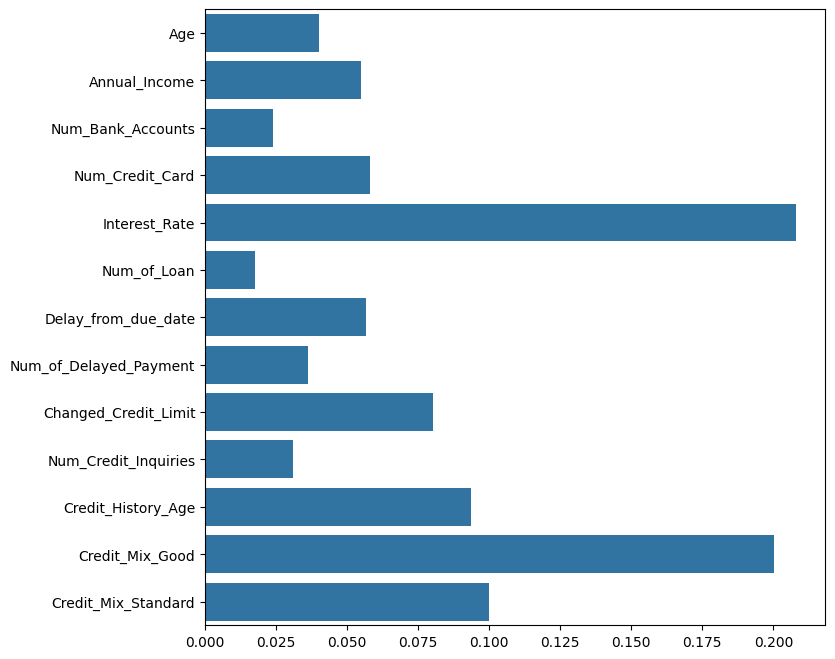

In [380]:
plt.figure(figsize=(8, 8))
sns.barplot(x=tree.feature_importances_, y=var)
plt.show()

[[1916   45  958]
 [ 147 3439 1239]
 [ 818 1122 6886]]
              precision    recall  f1-score   support

        Good       0.67      0.66      0.66      2919
        Poor       0.75      0.71      0.73      4825
    Standard       0.76      0.78      0.77      8826

    accuracy                           0.74     16570
   macro avg       0.72      0.72      0.72     16570
weighted avg       0.74      0.74      0.74     16570



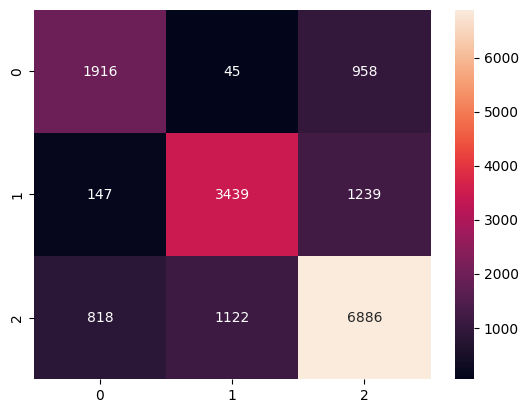

In [381]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import seaborn as sns
cm = confusion_matrix(y_test,preds)
print(cm)
sns.heatmap(cm, annot=True, fmt="d")
print(classification_report(y_test, preds))

**Análise**
- Classe Good: 1916 acertos, com confusão principalmente para Standard (958 casos).
- Classe Poor: 3439 acertos, com 1239 confundidos como Standard.
- Classe Standard: 6886 acertos, com confusão razoável com Poor (1122) e Good (818).

Interpretação por categoria
- Good: F1-score de 0.66 indica desempenho regular, com precisão e recall equilibrados. O modelo consegue identificar razoavelmente essa classe, mas há bastante confusão com Standard.
- Poor: Apresenta bom desempenho, com equilíbrio entre precisão (0.75) e recall (0.71).
- Standard: Tem o melhor desempenho geral, com precisão e recall altos e consistentes.

O modelo apresenta uma performance confiável e estável, com resultados equilibrados entre as classes. A classe Standard continua sendo a mais bem classificada, enquanto a classe Good exige maior atenção, especialmente na redução de confusões com outras categorias. No geral, trata-se de um modelo bem treinado e com boa capacidade de generalização.

## 6.2 Random Forest

In [399]:
from sklearn.ensemble import RandomForestClassifier

resultados = []

for n in range(10, 31):  # n_estimators de 1 a 30
    for depth in range(15, 21):  # max_depth de 10 a 20
        rf = RandomForestClassifier(n_estimators=n, max_depth=depth, random_state=42)
        rf.fit(X_train, y_train)
        acc_treino = round(rf.score(X_train, y_train) * 100, 2)
        preds = rf.predict(X_test)
        acc_teste = round(accuracy_score(y_test, preds) * 100, 2)
        resultados.append({
            "n_estimators": n,
            "max_depth": depth,
            "acc_treino": acc_treino,
            "acc_teste": acc_teste
        })

# Criando o DataFrame
df_resultados = pd.DataFrame(resultados)

In [404]:
df_resultados['variacao'] = df_resultados['acc_treino'] - df_resultados['acc_teste']
df_resultados[(df_resultados['acc_teste'] > 79) & (df_resultados['acc_treino'] < 90)]

,n_estimators,max_depth,acc_treino,acc_teste,variacao
20,13,17,88.07,79.23,8.84
26,14,17,88.11,79.22,8.89
32,15,17,88.25,79.47,8.78
38,16,17,88.39,79.51,8.88
44,17,17,88.43,79.54,8.89
50,18,17,88.32,79.47,8.85
56,19,17,88.44,79.67,8.77
62,20,17,88.43,79.79,8.64
68,21,17,88.48,79.73,8.75
74,22,17,88.40,79.67,8.73


No Randon Forest observamos que o model não chega overfitar com os dados de treino. E analisando as Acurácias de Treino e Teste a melhor realação é com n_estimators = 30 e max_depth = 17 por ter uma boa relação entre acurácia treino (88.54) e teste (79.84)

In [406]:
rf = RandomForestClassifier(n_estimators=30, max_depth=17, random_state=42)
rf.fit(X_train, y_train)
acc_treino = round(rf.score(X_train, y_train) * 100, 2)
preds = rf.predict(X_test)
acc_teste = round(accuracy_score(y_test, preds) * 100, 2)
print(f"n_estimators: 22, max_depth: 17 -> Acc. Treino: {acc_treino}%, Acc. Teste: {acc_teste}%")

n_estimators: 22, max_depth: 17 -> Acc. Treino: 88.54%, Acc. Teste: 79.84%


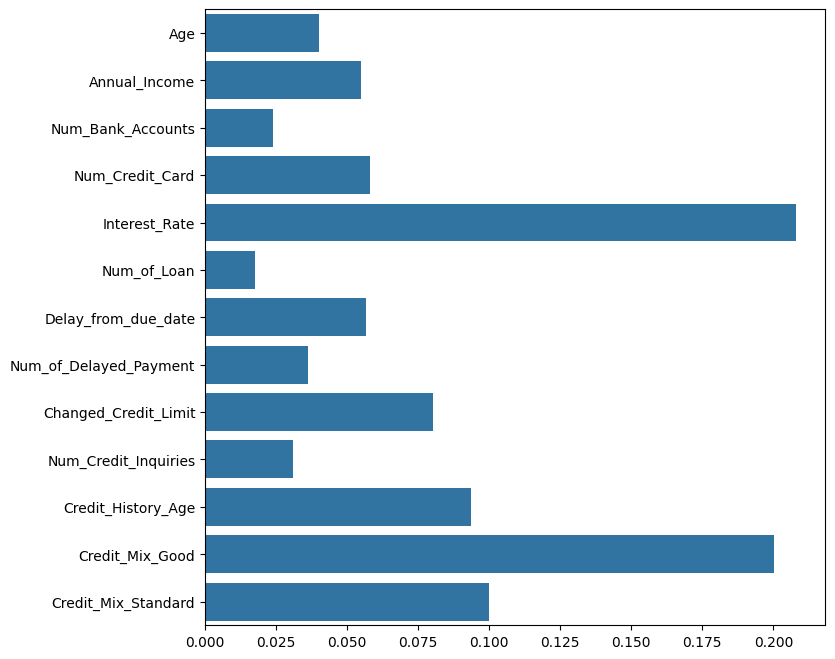

In [407]:
plt.figure(figsize=(8, 8))
sns.barplot(x=tree.feature_importances_, y=var)
plt.show()

[[2275    5  639]
 [ 101 3794  930]
 [ 682  983 7161]]
              precision    recall  f1-score   support

        Good       0.74      0.78      0.76      2919
        Poor       0.79      0.79      0.79      4825
    Standard       0.82      0.81      0.82      8826

    accuracy                           0.80     16570
   macro avg       0.79      0.79      0.79     16570
weighted avg       0.80      0.80      0.80     16570



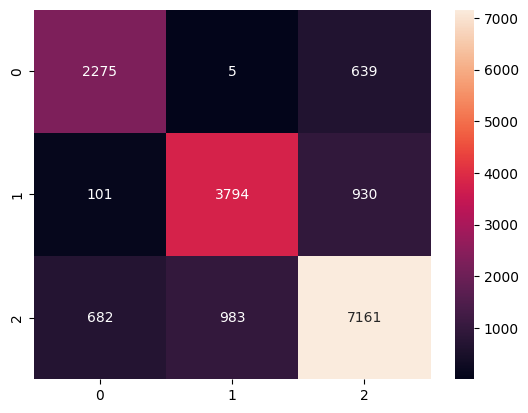

In [408]:
cm = confusion_matrix(y_test,preds)
print(cm)
sns.heatmap(cm, annot=True, fmt="d")
print(classification_report(y_test, preds))

## 6.3 Análise e Conclusão

**Análise**

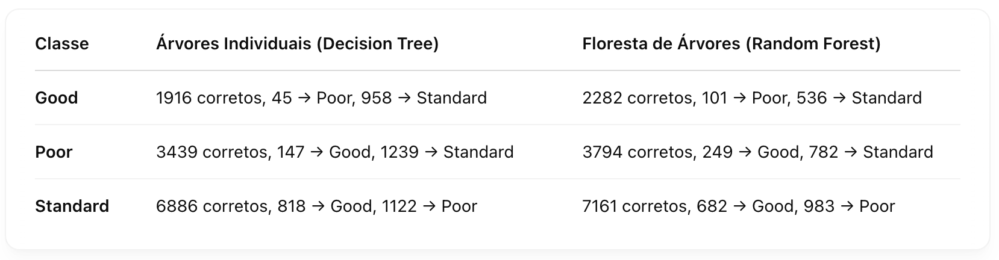

- O Random Forest reduziu significativamente a confusão entre as classes.
- O número de acertos para todas as classes aumentou, especialmente para Good e Poor.
- Reduziu drasticamente os falsos positivos e negativos em todas as direções.
- Acurácia aumentou de 74% para 80%.
- Todos os indicadores de qualidade (precision, recall, F1) evoluíram.
- Randon Forest é o melhor opção para se seguir com o modelo.

# 7. Aplicação do K-Means

Após a realização de alguns testes de seleção de variáveis, foram escolhidas as seguintes features para o modelo de clusterização K-Means: Quantidade de Empréstimos, Tempo de Histórico com a Empresa e Número de Empréstimos Atrasados. A escolha dessas variáveis foi pautada tanto em critérios técnicos quanto em critérios de negócio.

Do ponto de vista de negócio, essas variáveis permitem capturar diferentes dimensões relevantes do relacionamento do cliente com a empresa: o volume de operações financeiras realizadas (Quantidade de Empréstimos), o nível de fidelização ou tempo de vínculo (Tempo de Histórico) e o comportamento de risco (Empréstimos Atrasados). Espera-se, com isso, formar grupos de clientes com características distintas, o que é fundamental para estratégias de segmentação, personalização de ofertas, definição de políticas de crédito e ações de relacionamento.

Além disso, essas variáveis apresentaram boa variabilidade e não apresentaram multicolinearidade significativa entre si, o que favorece a formação de clusters bem definidos e com significado interpretável.

In [497]:
variaveis = ['Num_of_Delayed_Payment', 'Num_of_Loan', 'Credit_History_Age','Credit_Score']
df_kmeans = df_clear[variaveis].copy()
df_kmeans

,Num_of_Delayed_Payment,Num_of_Loan,Credit_History_Age,Credit_Score
0,7.0,4.0,265.0,Good
1,0.0,4.0,265.0,Good
2,7.0,4.0,267.0,Good
3,4.0,4.0,268.0,Good
4,0.0,4.0,269.0,Good
...,...,...,...,...
83139,7.0,2.0,378.0,Poor
83140,7.0,2.0,379.0,Poor
83141,6.0,2.0,380.0,Poor
83142,0.0,2.0,381.0,Standard


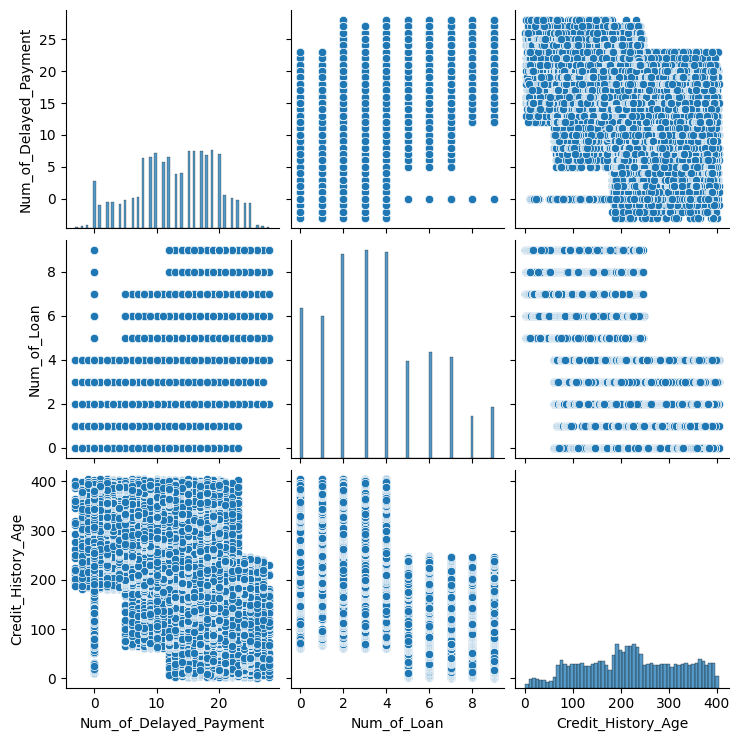

In [498]:
sns.pairplot(df_kmeans)

In [499]:
from sklearn.cluster import KMeans

variaveis.remove('Credit_Score')

kmeans = KMeans(n_clusters=3, random_state = 3)
kmeans.fit(df_kmeans[variaveis])
kmeans.labels_

df_kmeans['cluster'] = kmeans.labels_
df_kmeans

,Num_of_Delayed_Payment,Num_of_Loan,Credit_History_Age,Credit_Score,cluster
0,7.0,4.0,265.0,Good,1
1,0.0,4.0,265.0,Good,1
2,7.0,4.0,267.0,Good,1
3,4.0,4.0,268.0,Good,1
4,0.0,4.0,269.0,Good,1
...,...,...,...,...,...
83139,7.0,2.0,378.0,Poor,0
83140,7.0,2.0,379.0,Poor,0
83141,6.0,2.0,380.0,Poor,0
83142,0.0,2.0,381.0,Standard,0


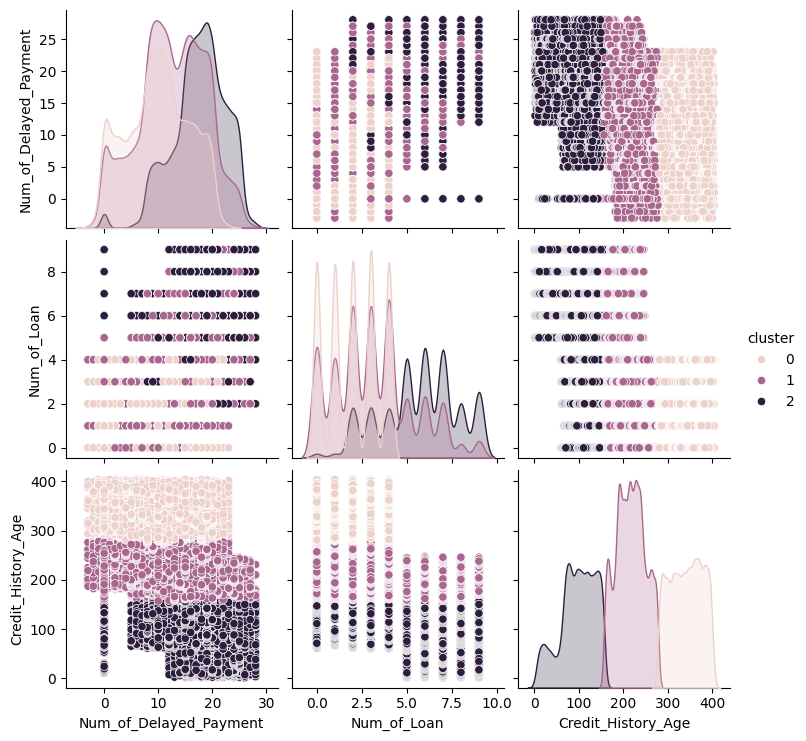

In [500]:
sns.pairplot(df_kmeans, hue = 'cluster')

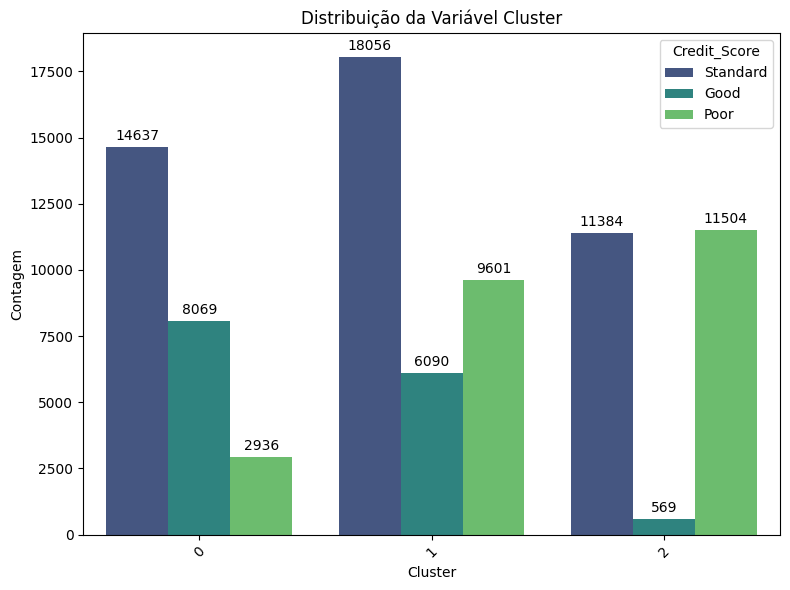

In [501]:

fig, ax = plt.subplots(figsize=(8, 6)) 
sns.countplot(data=df_kmeans, x='cluster', hue='Credit_Score', palette='viridis', dodge=True, ax=ax)

# Adiciona rótulos no topo das barras
for container in ax.containers:
    ax.bar_label(container, fontsize=10, padding=3)

# Títulos e rótulos
ax.set_title('Distribuição da Variável Cluster')
ax.set_xlabel('Cluster')
ax.set_ylabel('Contagem')
ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

In [502]:
df_kmeans.groupby('cluster').describe()

Num_of_Delayed_Payment                                              \
                         count       mean       std  min   25%   50%   75%   
cluster                                                                      
0                      25642.0   9.920268  5.780096 -3.0   6.0  10.0  14.0   
1                      33747.0  12.494059  6.193297 -3.0   8.0  13.0  17.0   
2                      23457.0  17.512384  4.856133  0.0  15.0  18.0  21.0   

              Num_of_Loan            ...           Credit_History_Age  \
          max       count      mean  ...  75%  max              count   
cluster                              ...                                
0        23.0     25642.0  2.013065  ...  3.0  4.0            25642.0   
1        28.0     33747.0  3.188639  ...  4.0  9.0            33747.0   
2        28.0     23457.0  5.699621  ...  7.0  9.0            23457.0   

                                                                   
               mean        std    min    25%    50%    75%    max  
cluster                                                            
0        340.731690  35.199240  279.0  311.0  342.0  371.0  404.0  
1        216.627700  31.638736  157.0  192.0  216.0  239.0  278.0  
2         97.216055  38.896411    1.0   73.0  100.0  129.0  157.0  

[3 rows x 24 columns]

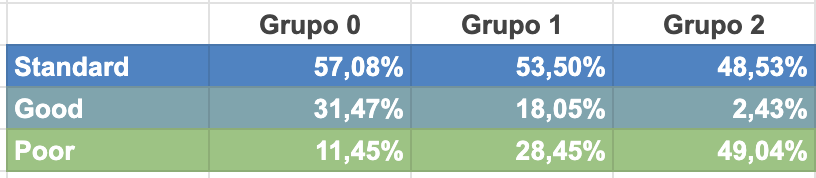

## 7.1 Análise e Conclusão

**Grupo 0 - CLientes Antigos com Baixo Risco**
- Média de pagamentos atrasados: 9.9
- Média de empréstimos: 2.01
- Média de histórico em meses: 340
- Porcentagem de Score de Crédito Good: 31.47%
- Porcentagem de Score de Crédito Standard: 57.08%
- Porcentagem de Score de Crédito Poor: 11.45%

Esse grupo é composto majoritariamente por clientes com longo relacionamento com a empresa, poucos empréstimos realizados e baixo número de atrasos. A maioria tem score de crédito Standard ou Good, com baixo percentual de risco (Poor). Trata-se de um perfil de clientes fidelizados e relativamente saudáveis financeiramente, sendo um grupo interessante para ações de retenção, programas de fidelidade ou ofertas de produtos premium com baixo risco de inadimplência.


**Grupo 1 - Clientes de Médio Risco e Relacionamento Intermediário**
- Média de pagamentos atrasados: 12.49
- Média de empréstimos: 3.18
- Média de histórico em meses: 216
- Porcentagem de Score de Crédito Good: 18.05%
- Porcentagem de Score de Crédito Standard: 53.50%
- Porcentagem de Score de Crédito Poor: 28.45%

Esse grupo apresenta um perfil intermediário, tanto em relação ao tempo de relacionamento quanto ao comportamento de risco. Há um número maior de empréstimos e atrasos comparado ao Grupo 0, e uma parcela significativa já está no score Poor. Pode indicar um grupo que já teve um bom histórico, mas apresenta sinais de deterioração no comportamento de crédito. Estratégias de monitoramento, renegociação de dívidas e ofertas mais cautelosas podem ser aplicadas aqui.

**Grupo 2 - Clientes Recentes e de Alto Risco**
- Média de pagamentos atrasados: 17.51
- Média de empréstimos: 5.59
- Média de histórico em meses: 97
- Porcentagem de Score de Crédito Good: 2.43%
- Porcentagem de Score de Crédito Standard: 48.53%
- Porcentagem de Score de Crédito Poor: 49.04%

Este grupo é formado por clientes com menor tempo de relacionamento, maior volume de empréstimos e alto número de atrasos. Praticamente metade está com score de crédito Poor, o que demonstra um perfil de alto risco e baixa fidelização. O grupo pode representar clientes que entram e saem rapidamente do portfólio, e exigem maior atenção em políticas de concessão de crédito, garantia e cobrança preventiva.